In [60]:
import glob
import multiprocessing as mp
import matplotlib.pyplot as plt
import numpy as np
import os
import oscdeeppy as odp
from importlib import reload

# Image Lists

In [2]:
DTYPE = np.float32 # Not sure what int types will do; float64 is probably overkill 
BLACKPOINT_SIGMA=2.7 # Larger tends to make darker images
SYMMETRY_SIGMA = 0.5 # offset from background peak in terms of backgroun sigma for stretching

bias = glob.glob('bias/*.ARW')[:100]
darks = glob.glob('darks/*.ARW')[:100]
DARK_EXPOSURE_TIME = 30

#flats = glob.glob('../astro/2024-02-24*/flats/*.ARW')
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 10.) # 1/10s exposures vs 30s exposures
#lights = glob.glob('../astro/2024-02-24*/lights/*.ARW')
#LIGHT_DARK_SCALING_FACTOR = 240/DARK_EXPOSURE_TIME # 240s exposures vs 30s exposures
#DRIZZLE = True
#tag = 'm101_whirlpool' # FIXME double check

#flats = glob.glob('../astro/2023-12-15*/Clean Flats/*.ARW') # Did I really not take flats for orion...
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 10.) # 1/10s exposures vs 30s exposures
#lights = glob.glob('../astro/2023-12-13*/Orion*/*.ARW')
#LIGHT_DARK_SCALING_FACTOR = 120/DARK_EXPOSURE_TIME # 120s exposures vs 30s exposures
#DRIZZLE = True
#tag = 'orion_nebula'

#flats = glob.glob('../astro/2024-02-08*/flats/*.ARW')
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 10.) # 1/15s exposures vs 30s exposures
#lights = glob.glob('../astro/2024-02-08*/M81*/*.ARW')
#LIGHT_DARK_SCALING_FACTOR = 300/DARK_EXPOSURE_TIME # 300s exposures vs 30s exposures
#DRIZZLE = True
#tag = 'm81_bode_m82_cigar_v2'

flats = glob.glob('../astro/2023-12-15*/Clean Flats/*.ARW')
FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 10.) # 1/15s exposures vs 30s exposures
lights = glob.glob('../astro/2023-12-15*/Andromeda*/*.ARW')
LIGHT_DARK_SCALING_FACTOR = 300/DARK_EXPOSURE_TIME # 300 exposures vs 30s exposures
DRIZZLE = True
tag = 'andromeda'

#flats = glob.glob('../astro/2023-12-15*/Clean Flats/*.ARW')
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 10.) # 1/15s exposures vs 30s exposures
#lights = glob.glob('../astro/2023-12-15*/Triangulum*/*.ARW')
#LIGHT_DARK_SCALING_FACTOR = 300/DARK_EXPOSURE_TIME # 300 exposures vs 30s exposures
#DRIZZLE = True
#tag = 'triangulum'

#flats = glob.glob('../astro/*M51*/flats/*.ARW')[:100]
#lights = glob.glob('../astro/*M51*/*M51*/*.ARW')
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 15.) # 1/15s exposures vs 30s exposures
#LIGHT_DARK_SCALING_FACTOR = 240/DARK_EXPOSURE_TIME # 240 exposures vs 30s exposures
#DRIZZLE = True
#tag = 'm51_whirlpool_galaxy'

#flats = glob.glob('../astro/*Leo Triplet*/flats/*.ARW')[:100]
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 15.) # 1/15s exposures vs 30s exposures
#lights = glob.glob('../astro/*Leo Triplet*/*Leo Triplet*/*.ARW')
#LIGHT_DARK_SCALING_FACTOR = 240/DARK_EXPOSURE_TIME # 240 exposures vs 30s exposures
#DRIZZLE = True
#tag = 'leo_triplet'

#flats = glob.glob('flats_v3/*.ARW')[:100]
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 15.) # 1/15s exposures vs 30s exposures
#lights = glob.glob('../astro/*Markarian*/*Markarian*/*.ARW')
#LIGHT_DARK_SCALING_FACTOR = 500/DARK_EXPOSURE_TIME # 500s exposures vs 30s exposures
#DRIZZLE = True
#tag = 'markarians_chain_v5'

#flats = glob.glob('flats_v3/*.ARW')[:100]
#FLAT_DARK_SCALING_FACTOR = 1/(DARK_EXPOSURE_TIME * 15.) # 1/15s exposures vs 30s exposures
#lights = glob.glob('../astro/*Lagoon*/Lagoon*/*.ARW')
#LIGHT_DARK_SCALING_FACTOR = 300/DARK_EXPOSURE_TIME # 300 exposures vs 30s exposures
#DRIZZLE = True
#tag = 'lagoon_nebula_v2'

print(len(bias),len(flats),len(darks),len(lights))

100 13 100 9


# Calibration Data Processing

In order to image very dim objects, one requires a very sensitive and very well calibrated sensor. Data taken in contrived situations (very short exposure, lens cap on or off, pointed at uniform white surface, etc) provide footholds for calculating unknown quantities in the imaging system, like precise per-pixel sensitivity, positions of dust shadows, hot/dead pixels etc.

## Bias

Bias frames are taken fast at the same gain as light and dark to capture constant offsets in all images.

In [3]:
bias_set = odp.RawSet(bias)

### Stacking

In [4]:
bias_avg = odp.simple_stack(bias_set, dtype=DTYPE, verbose=True)

### Histogram

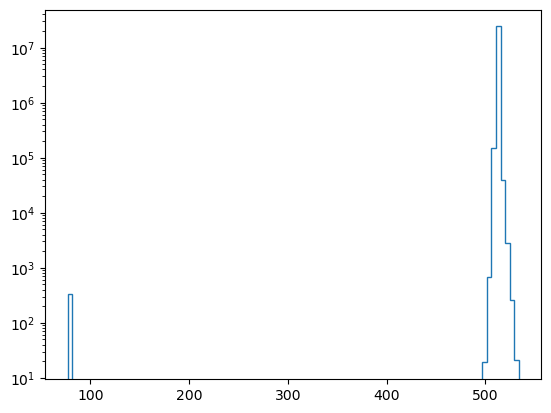

In [5]:
plt.hist(bias_avg.flatten(), bins=100, histtype='step',label='Bias Avg')
plt.yscale('log')

## Dark

Dark frames are long exposure at the same gain as light frames, but with the sensor dark. These capture noise that builds with time. Helpful to have the same exposure time as light frames, but can be scaled to compensate. The bias must be subtracted from the dark frames.

In [6]:
dark_set = odp.RawSet(darks)

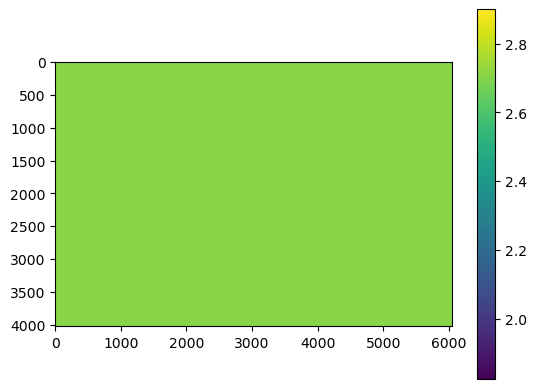

In [7]:
plt.imshow(np.log10(np.clip(dark_set[0],1e-15,None)))
plt.colorbar()

### Stacking

In [8]:
dark_avg = odp.simple_stack(dark_set, dtype=DTYPE, verbose=True)

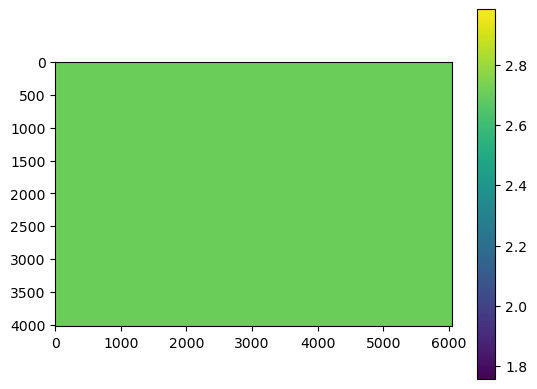

In [9]:
plt.imshow(np.log10(np.clip(dark_avg,1e-15,None)))
plt.colorbar()

### Bias Subtraction

In [10]:
dark_unbiased = dark_avg - bias_avg

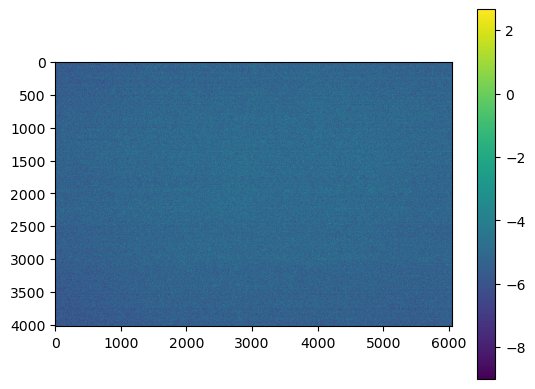

In [11]:
plt.imshow(np.log10(np.clip(dark_unbiased,1e-9,None)))
plt.colorbar()

### Histogram

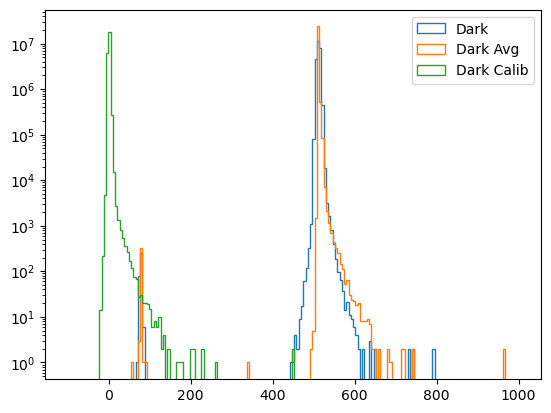

In [12]:
plt.hist(dark_set[0].ravel(), bins=np.linspace(-100,1000,200), histtype='step',label='Dark')
plt.hist(dark_avg.ravel(), bins=np.linspace(-100,1000,200), histtype='step',label='Dark Avg')
plt.hist(dark_unbiased.ravel(), bins=np.linspace(-100,1000,200), histtype='step',label='Dark Calib')
plt.yscale('log')
plt.legend()

## Flat

Flats capture nonuniform response to light in the optical system due to imperfections in the telescope/lens, dust on the sensor, or senor response itself. This corrects for effects similar to vignetting as well. The bias (recommended) and darks (optional) should be subtracted from the flats. Flats are normalized so that the multiplicative effect does not modify the mean intensity of a uniform image.

In [13]:
flat_set = odp.RawSet(flats)

### Bias & Dark Subtraction

In [14]:
def bias_dark_subtact(img, bias, dark, factor):
    return img - bias - dark*factor

In [15]:
flat_calib_set = odp.DiskSet('flat_calib.apy',recreate=True, dtype=DTYPE, num_img=len(flat_set), img_shape=flat_set.img_shape)

with odp.ImageProcessor(nproc=16) as proc:
    proc.map(bias_dark_subtact, flat_set, args=(bias_avg, dark_unbiased, FLAT_DARK_SCALING_FACTOR), output_set=flat_calib_set, verbose=True)

Starting 0
Starting 1
Starting 2
Starting 3
Starting 4
Starting 5
Starting 6
Starting 7
Starting 8
Starting 9
Starting 10
Starting 11
Starting 12
Finished 0
Finished 1
Finished 2
Finished 3
Finished 4
Finished 5
Finished 6
Finished 7
Finished 8
Finished 9
Finished 10
Finished 11
Finished 12


### Stacking

In [16]:
flat_avg = odp.simple_stack(flat_calib_set, dtype=DTYPE, verbose=True)

### Debayering

In [17]:
flat_debayer = odp.debayer_full(flat_avg)

### Normalization

In [18]:
flat_norm = flat_debayer/np.mean(np.mean(flat_debayer,axis=0),axis=0)
flat_norm[flat_norm == 0.0] = 1.0

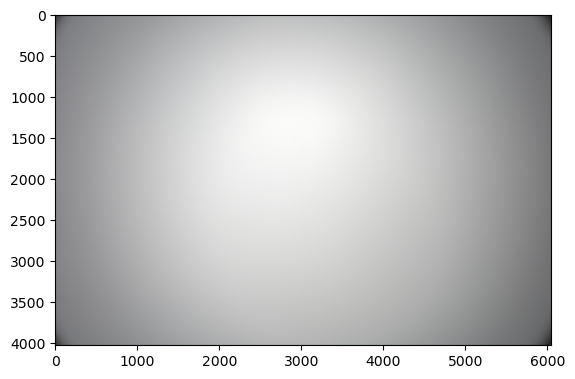

In [19]:
odp.display_rgb(flat_norm)

# Light Image Processing

In [20]:
light_set = odp.RawSet(lights)

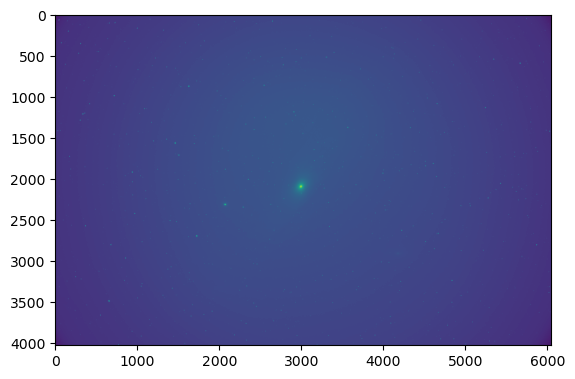

In [21]:
plt.imshow(light_set[0])

## Bias, Dark, & Flat Calibration + Debayer

In [22]:
bias_master = bias_avg
dark_master = dark_unbiased
flat_master = flat_norm

def calibrate_light_img(img, dark_factor):
    '''
    dark_master and flat_master should be bias subtracted
    '''
    return odp.debayer_full(img - bias_master - dark_master*dark_factor) / flat_master

In [23]:
light_calib_set = odp.DiskSet('light_calib.apy',recreate=True, dtype=DTYPE, num_img=len(light_set), img_shape=light_set.img_shape+(3,))

with odp.ImageProcessor(nproc=16) as proc:
    proc.map(calibrate_light_img, light_set, args=(LIGHT_DARK_SCALING_FACTOR,), output_set=light_calib_set, verbose=True)

Starting 0
Starting 1
Starting 2
Starting 3
Starting 4
Starting 5
Starting 6
Starting 7
Starting 8
Finished 0
Finished 5
Finished 2
Finished 3
Finished 7
Finished 8
Finished 4
Finished 1
Finished 6


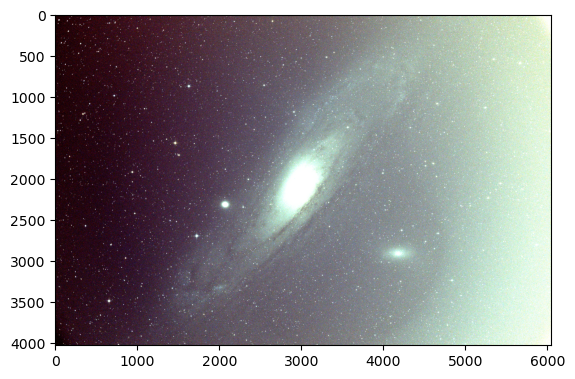

In [24]:
odp.display_rgb(light_calib_set[0], scale='auto')

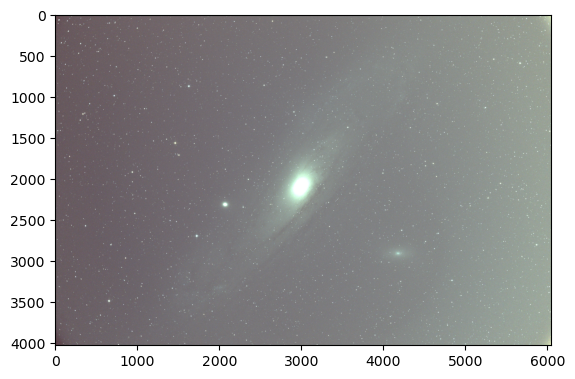

In [25]:
odp.display_rgb(light_calib_set[0], scale='linear', clip_sigmas=5)

## Background Extraction

In [26]:
light_calib_bkg_set = odp.DiskSet('light_calib_bkg.apy',recreate=True, dtype=DTYPE, num_img=len(light_calib_set), img_shape=light_calib_set.img_shape)

with odp.ImageProcessor(nproc=16) as proc:
    proc.map(odp.polyfit_bkg_extract, light_calib_set, output_set=light_calib_bkg_set, verbose=True)

Starting 0
Starting 1
Starting 2
Starting 3
Starting 4
Starting 5
Starting 6
Starting 7
Starting 8
Finished 3
Finished 4
Finished 6
Finished 7
Finished 1
Finished 5
Finished 8
Finished 2
Finished 0


Image 0


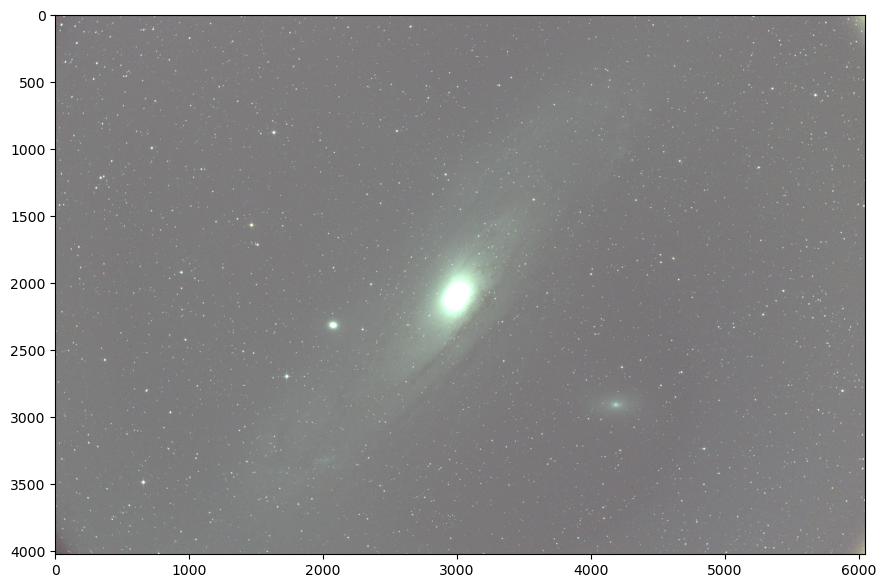

In [61]:
for i in range(len(light_calib_bkg_set)):
    print(f'Image {i}')
    plt.figure(figsize=[14,7])
    odp.display_rgb(light_calib_bkg_set[i],scale='linear',clip_sigmas=5)
    plt.show()
    plt.close()
    break

## Find Stars

Fit(344): Optimization terminated successfully.
FWHM 3.5101146795950324 ECC 0.27635162560498044 SNR 3.523092539361719 LVL 8189.704100958685 DIST 2.1034706906665472
Candidate Excluded
Fit(1040): Optimization terminated successfully.
FWHM 253262313.44267264 ECC 1.0 SNR 2.2124980231436453 LVL 4398.428072045767 DIST 23.789930282407553
Candidate Excluded
Fit(822): Optimization terminated successfully.
FWHM 4.01541721313832 ECC 0.5496180097680666 SNR 5.778439728664814 LVL 10902.5828185589 DIST 21.873681850838558
Candidate Excluded
Fit(402): Optimization terminated successfully.
FWHM 14.198030948888263 ECC 0.6528515304701168 SNR 5.451029286522345 LVL 8908.907891680994 DIST 0.48082670081411916


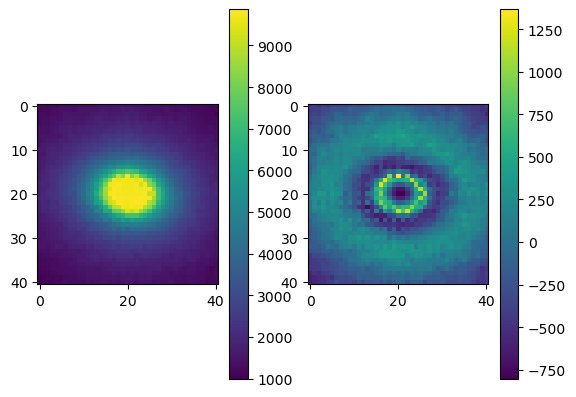

Fit(542): Optimization terminated successfully.
FWHM 9.93544245285564 ECC 0.2978854481110421 SNR 16.48532571601497 LVL 12905.268136068176 DIST 0.3617740919183921


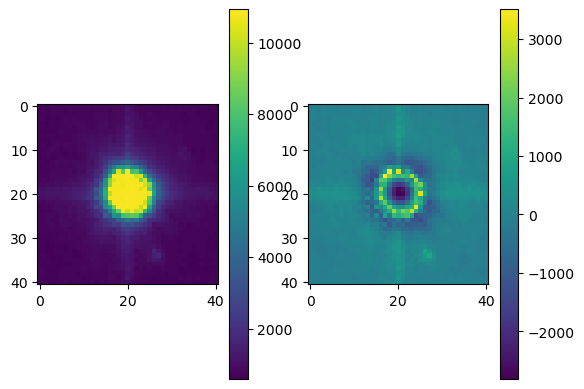

array([[2.07448061e+03, 2.31498564e+03, 1.41980309e+01, 8.90890789e+03,
        1.63435333e+03, 6.52851530e-01],
       [1.72828443e+03, 2.69777644e+03, 9.93544245e+00, 1.29052681e+04,
        7.82833676e+02, 2.97885448e-01]])

In [28]:
#Just to demo
odp.find_stars(light_calib_bkg_set[0], num_stars=2, patch_radius=20, snr_min=5, verbose=True)

In [29]:
with odp.ImageProcessor(nproc=16) as proc:
    reg_stars = proc.map(odp.find_stars, light_calib_bkg_set, num_stars=250, patch_radius=20, snr_min=5, verbose=True)

Starting 0
Starting 1
Starting 2
Starting 3
Starting 4
Starting 5
Starting 6
Starting 7
Starting 8
Finished 7
Finished 4
Finished 6
Finished 1
Finished 8
Finished 3
Finished 5
Finished 2
Finished 0


Image 0 FWHM 4.517 ECC 0.610


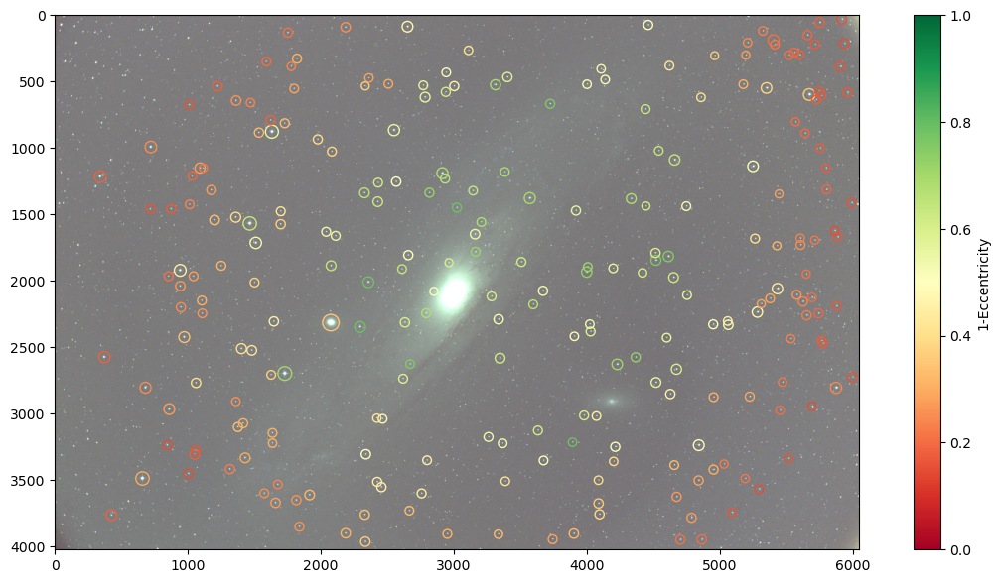

In [62]:
from matplotlib import colormaps
cmap = colormaps['RdYlGn']

for i,(img,stars) in enumerate(zip(light_calib_bkg_set,reg_stars)):
    print(f'Image {i} FWHM {np.mean(stars[:,2]):0.3f} ECC {np.mean(stars[:,5]):0.3f}')
    plt.figure(figsize=[14,7])
    odp.display_rgb(img,scale='linear',clip_sigmas=5)
    sc = plt.scatter(stars[:,0], stars[:,1], s=10*stars[:,2], fc='none', ec=cmap(1.0-stars[:,5]))
    plt.colorbar(sc,label='1-Eccentricity')
    sc.set_cmap(cmap)
    sc.set_clim(0,1)
    plt.show()
    plt.close()
    break

## Find Constellations

In [32]:
with mp.Pool(16) as pool:
    reg_consts = pool.map(odp.build_constellations,reg_stars)

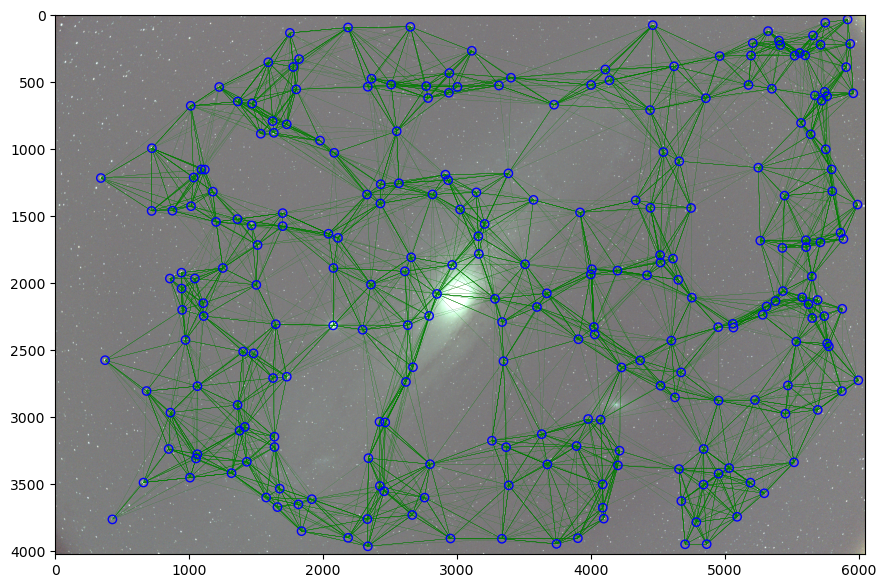

In [63]:
for i,(img,stars,tris) in enumerate(zip(light_calib_bkg_set,reg_stars,reg_consts)):
    plt.figure(figsize=[14,7])
    odp.display_rgb(img,scale='linear',clip_sigmas=5)
    odp.draw_constellations(tris, color='g', alpha=1.0, linewidth=0.1)
    plt.scatter(stars[:,0], stars[:,1], fc='none', ec='b')
    plt.show()
    plt.close()
    break

## Find Alignment Transformations

In [34]:
ref_idx = 0

import itertools

class ref_skip:
    '''For a starmap operation, this can wrap a function to skip processing a specific index and return 
       a fixed value (usually None) instead. Assumes whatever you would have iterated over with the bare 
       function is instead wrapped in enumerate'''
    
    def __init__(self, f, ref_idx, ref_val=None):
        self.f = f
        self.ref_idx = ref_idx
        self.ref_val = ref_val
        
    def __call__(self, i, args, **kwargs):
        if i == self.ref_idx:
            return self.ref_val
        else:
            return self.f(*args, **kwargs)

with mp.Pool(16) as pool:
    const_pairs = pool.starmap(ref_skip(odp.find_corresponding_constellations,ref_idx), enumerate(zip(itertools.repeat(reg_consts[ref_idx]),reg_consts)))
    star_pairs = pool.starmap(ref_skip(odp.find_corresponding_points,ref_idx), enumerate(const_pairs))
    fit_txs = pool.starmap(ref_skip(odp.find_transformation,ref_idx), enumerate(star_pairs))

Image 1
          message: Optimization terminated successfully.
          success: True
           status: 0
              fun: 31.65314393561648
                x: [-1.503e+01  2.083e+01  1.330e-04]
              nit: 3
            direc: [[ 1.000e+00  0.000e+00  0.000e+00]
                    [ 0.000e+00  0.000e+00  1.000e+00]
                    [ 5.781e-02  7.761e-02  2.384e-05]]
             nfev: 109
 average_distance: 0.305972139370585
      total_stars: 229
        star_mask: [ True  True ...  True  True]


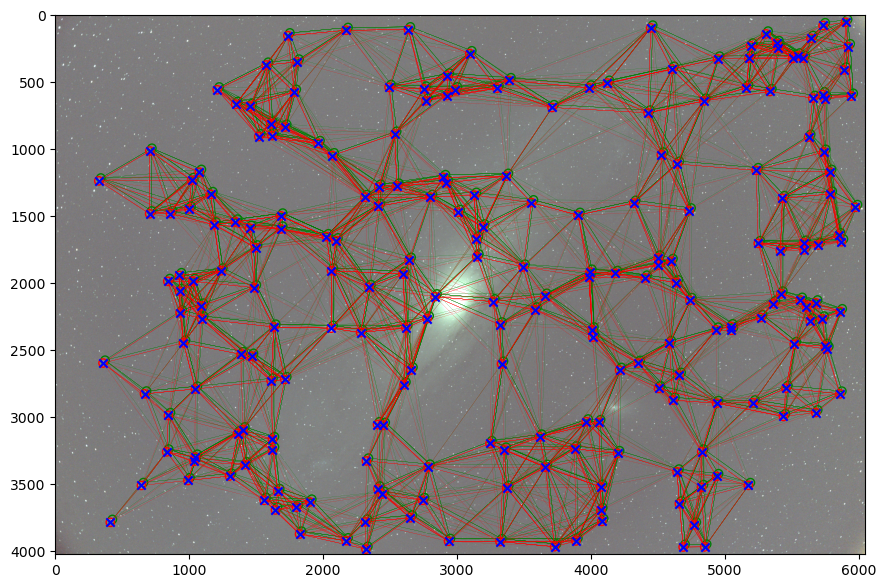

In [64]:
for i,(img,stars,tris,fit) in enumerate(zip(light_calib_bkg_set,star_pairs,const_pairs,fit_txs)):
    if ref_idx == i:
        continue
    print(f'Image {i}')
    print(fit)
    plt.figure(figsize=[14,7])
    odp.display_rgb(img,scale='linear',clip_sigmas=5)
    stars_a,stars_b = stars
    tris_a,tris_b = tris
    odp.draw_constellations(tris_a, color='g', alpha=1.0, linewidth=0.1)
    plt.scatter(stars_a[fit.star_mask,0], stars_a[fit.star_mask,1], fc='none', ec='g')
    odp.draw_constellations(tris_b, color='r', alpha=1.0, linewidth=0.1)
    plt.scatter(stars_b[fit.star_mask,0], stars_b[fit.star_mask,1], fc='none', ec='r')
    stars_a_tx = odp.transform_coords(stars_a[fit.star_mask,:2],*fit.x)
    plt.scatter(stars_a_tx[:,0], stars_a_tx[:,1], c='b', marker='x')
    plt.show()
    plt.close()
    break

## Transform Images

In [36]:
transformed_shape = tuple((x*2 if DRIZZLE else x) if i < 2 else x for i,x in enumerate(light_calib_bkg_set.img_shape))

light_regtx = odp.DiskSet('light_calib_bkg_reg.apy', recreate=True, dtype=DTYPE, num_img=len(light_calib_bkg_set), img_shape=transformed_shape)

with odp.ImageProcessor(nproc=8) as proc:
    proc.map(odp.image_transform_chunked, light_calib_bkg_set, fit_txs, drizzle=DRIZZLE, output_set=light_regtx, verbose=True)

Starting 0
Starting 1
Starting 2
Starting 3
Starting 4
Starting 5
Starting 6
Starting 7
Starting 8
Finished 5
Finished 0
Finished 4
Finished 6
Finished 7
Finished 1
Finished 2
Finished 3
Finished 8


## Image Selection

Text(0.5, 0, 'eccentricity')

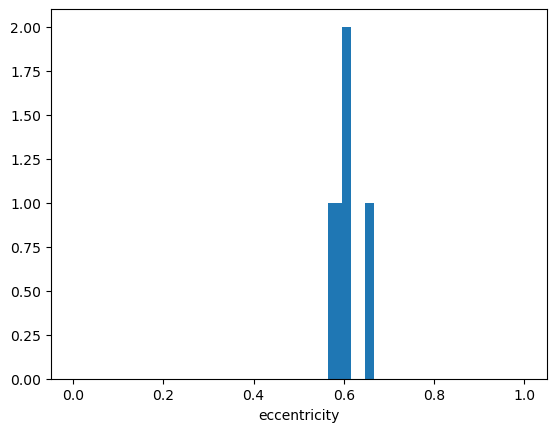

In [37]:
eccentricity = np.asarray([np.mean(star[:,5]) for star in reg_stars])
plt.hist(eccentricity,bins=np.linspace(0,1,100))
plt.xlabel('eccentricity')

Text(0.5, 0, 'fwhm')

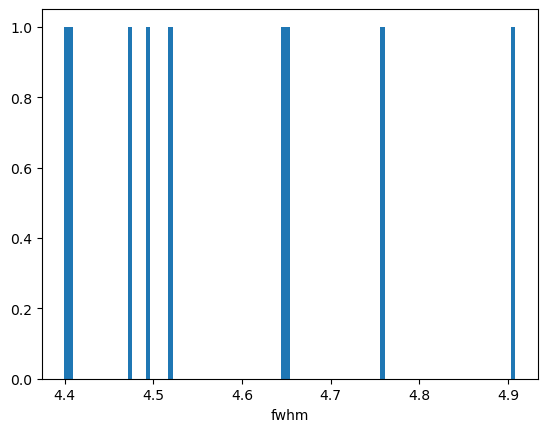

In [38]:
fwhm = np.asarray([np.mean(star[:,2]) for star in reg_stars])
plt.hist(np.clip([np.mean(star[:,2]) for star in reg_stars],0,10),bins=100)
plt.xlabel('fwhm')

Text(0.5, 0, 'total stars')

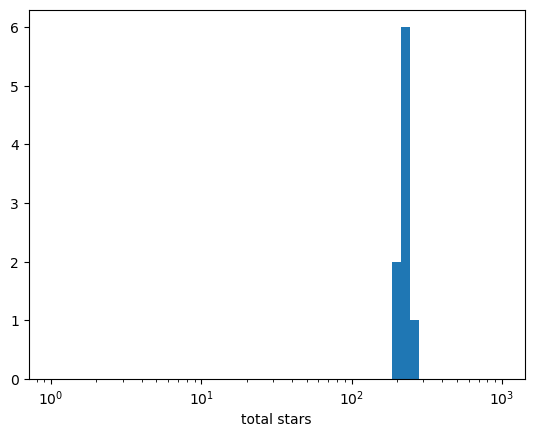

In [39]:
total_stars = np.asarray([fit.total_stars if fit else len(reg_stars[ref_idx]) for fit in fit_txs ])
plt.hist(total_stars,bins=np.logspace(0,3))
plt.xscale('log')
plt.xlabel('total stars')

Text(0.5, 0, 'average tx distance')

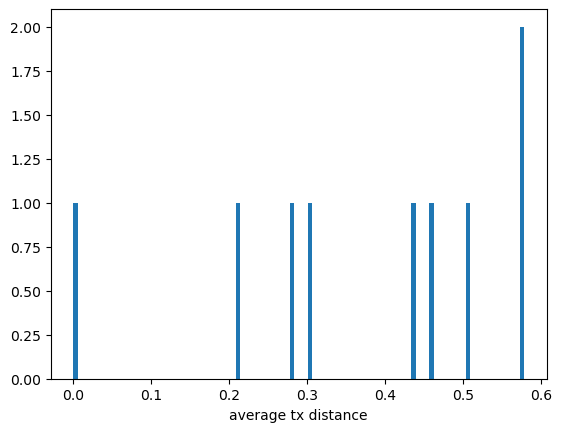

In [40]:
avg_dist = np.asarray([fit.average_distance if fit else 0.0 for fit in fit_txs ])
plt.hist(np.clip(avg_dist,0,10),bins=100)
plt.xlabel('average tx distance')

In [41]:
def median_sigma_cut(values, sigmas, **kwargs):
    m,s = np.median(values, **kwargs),np.std(values, **kwargs)
    return np.abs(values - m) < sigmas*s

star_selection = median_sigma_cut(fwhm, 3) & median_sigma_cut(eccentricity, 3)
fit_selection = (total_stars >= 10) & median_sigma_cut(avg_dist, 3)
selection = star_selection & fit_selection
print(selection)
print(f'Total Lights: {len(selection)}; Lights Used: {np.count_nonzero(selection)}')
for i,sel in enumerate(selection):
    if not sel:
        print(f'Rejected {i}: FWHM {fwhm[i]} ECC {eccentricity[i]} TOT {total_stars[i]} DIST {avg_dist[i]}')
        odp.display_rgb(light_calib_bkg_set[i],scale='linear',clip_sigmas=5)
        plt.show()
        plt.close()

[ True  True  True  True  True  True  True  True  True]
Total Lights: 9; Lights Used: 9


## Stacking (Winsor Implementation)

In [42]:
stacked = odp.winsor_stack(light_regtx, selection=selection, nproc=8, verbose=True)

Computing quantiles [0.030, 0.970] for winsorizing
Submitting chunk (0, 0)
Submitting chunk (0, 1000)
Submitting chunk (0, 2000)
Submitting chunk (0, 3000)
Submitting chunk (0, 4000)
Submitting chunk (0, 5000)
Submitting chunk (0, 6000)
Submitting chunk (0, 7000)
Submitting chunk (0, 8000)
Submitting chunk (1000, 0)
Submitting chunk (1000, 1000)
Submitting chunk (1000, 2000)
Finished chunk (0, 3000)
Finished chunk (0, 0)
Finished chunk (0, 5000)
Finished chunk (0, 7000)
Finished chunk (0, 1000)
Finished chunk (0, 2000)
Finished chunk (0, 6000)
Finished chunk (0, 8000)
Finished chunk (0, 4000)
Finished chunk (1000, 0)
Finished chunk (1000, 1000)
Finished chunk (1000, 2000)
Submitting chunk (1000, 3000)
Submitting chunk (1000, 4000)
Submitting chunk (1000, 5000)
Submitting chunk (1000, 6000)
Submitting chunk (1000, 7000)
Submitting chunk (1000, 8000)
Submitting chunk (2000, 0)
Submitting chunk (2000, 1000)
Submitting chunk (2000, 2000)
Submitting chunk (2000, 3000)
Submitting chunk (2000

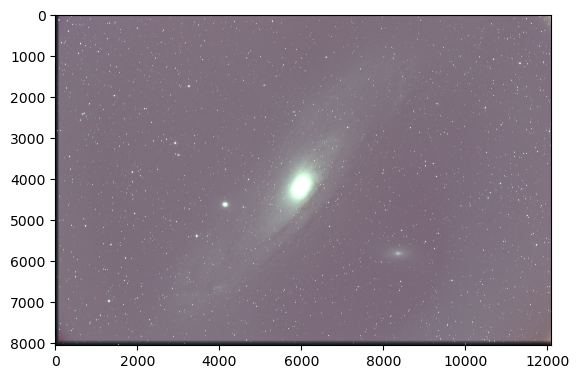

In [65]:
odp.display_rgb(stacked, scale='linear', clip_sigmas=5)

# Post-Processing

All the calibration, alignment, and stacking up to now has been pre-processing necessary to get one single image. From here the image is manipulated to arrive at something visually meaningful.

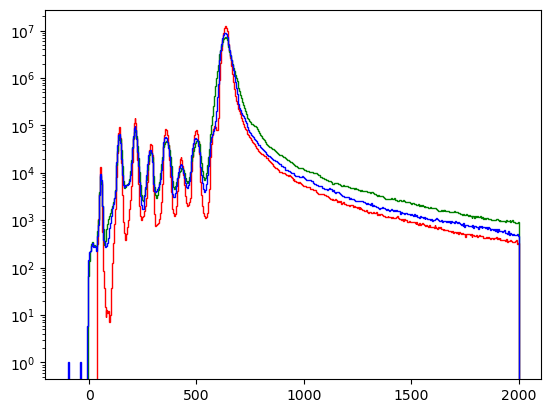

In [44]:
odp.show_hist(stacked, bins=np.linspace(-100,2000,500))
plt.yscale('log')

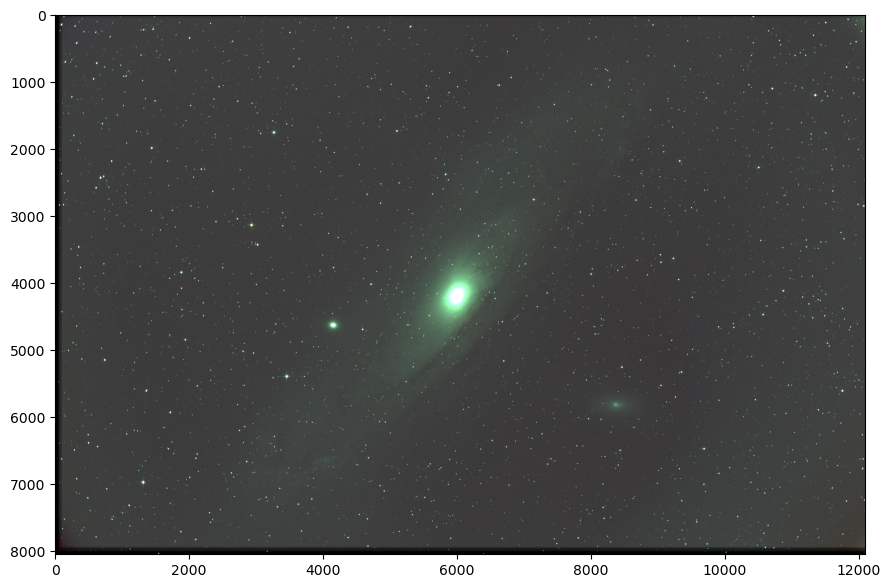

In [45]:
odp.linear_rgb(stacked, lower_limit=200, upper_limit=2000, quality=95)

## Background Extraction

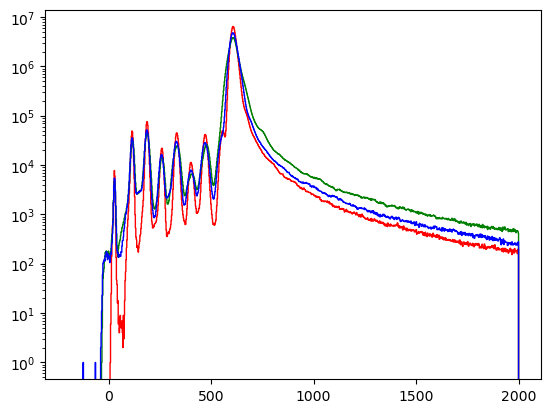

In [46]:
stacked_bkg,bkg = odp.polyfit_bkg_extract(stacked,order=5,return_bkg=True)
odp.show_hist(stacked_bkg, bins=np.linspace(-200,2000,1000))

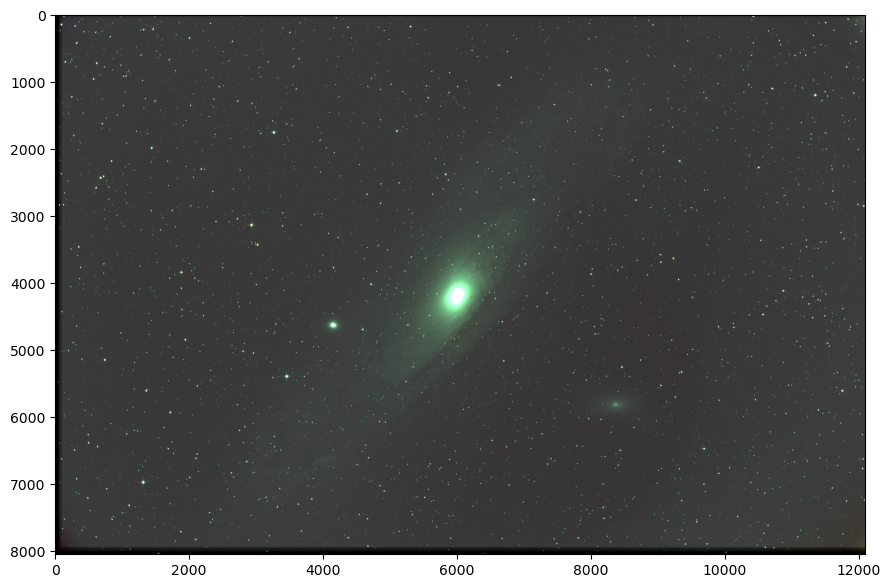

In [47]:
odp.linear_rgb(stacked_bkg, lower_limit=200, upper_limit=2000, quality=95)

## Equalize

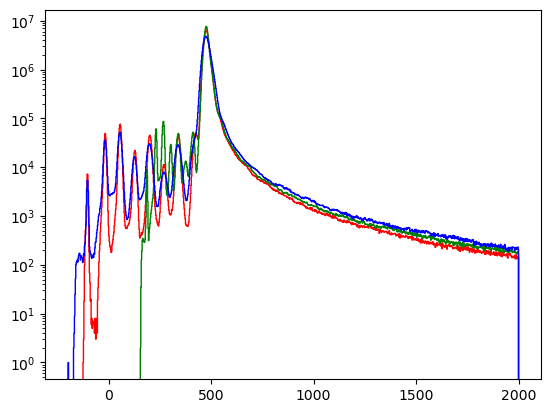

In [48]:
stacked_bkg_eq_base,med,sig  = odp.equalize_img(stacked_bkg, get_stats=True)
odp.show_hist(stacked_bkg_eq_base, bins=np.linspace(-200,2000,1000))

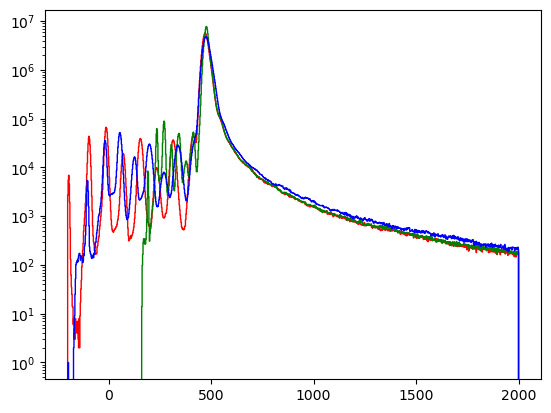

In [49]:
scale = np.asarray([1.15,0.985,1.0],dtype=DTYPE)
stacked_bkg_eq = stacked_bkg_eq_base*scale-med*(scale-1)
odp.show_hist(stacked_bkg_eq, bins=np.linspace(-200,2000,1000))

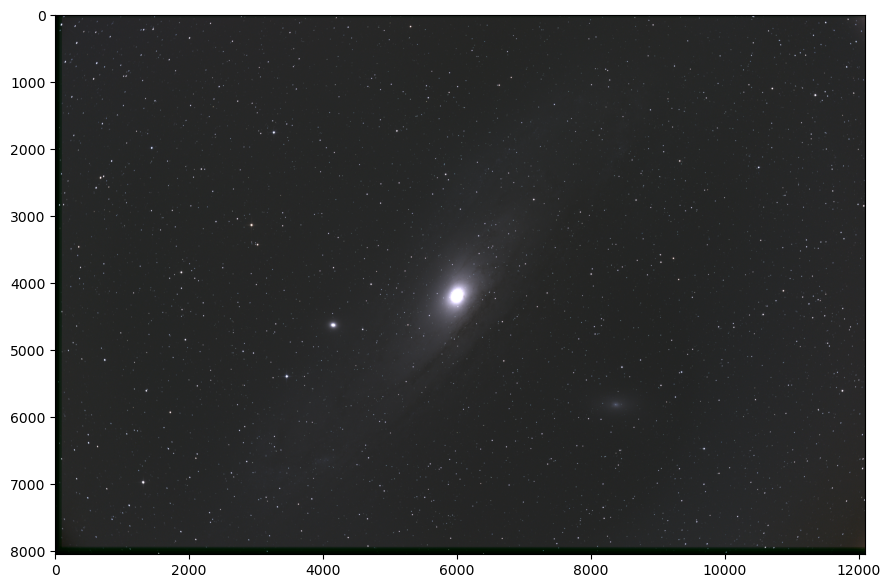

In [50]:
odp.linear_rgb(stacked_bkg_eq, lower_limit=200, upper_limit=2000, quality=95)

## Blackpoint and Whitepoint

Convert from arbitrary (12-16 bit) scale to represented as DTYPE to normalized [0,1] as DTYPE from here on

In [51]:
from scipy.optimize import minimize

def histogram_metrics(rgb):
    hist_median,hist_sigma = np.median(rgb),np.std(rgb)
    counts,edges = np.histogram(rgb,bins=np.linspace(hist_median-hist_sigma*2,hist_median+hist_sigma*2,500))
    centers = (edges[:-1]+edges[1:])/2
    
    fit = minimize(odp.hist_bkg_residual(centers, counts), (hist_median,hist_sigma,0,np.max(rgb)), method='Nelder-Mead')
    fit.bkg_mean,fit.bkg_sig,fit.bkg_bkg,fit.bkg_peak = fit.x
    fit.hist_median,fit.hist_sigma = hist_median,hist_sigma
    
    return fit

odp.histogram_metrics = histogram_metrics

In [52]:
hist_fit = odp.histogram_metrics(stacked_bkg_eq)
hist_fit

       message: Maximum number of function evaluations has been exceeded.
       success: False
        status: 1
           fun: 16776620944859.361
             x: [ 4.754e+02  9.685e+00 -1.007e+00  1.020e+07]
           nit: 340
          nfev: 800
 final_simplex: (array([[ 4.754e+02,  9.685e+00, -1.007e+00,  1.020e+07],
                       [ 4.754e+02,  9.685e+00, -1.007e+00,  1.020e+07],
                       ...,
                       [ 4.754e+02,  9.685e+00, -1.007e+00,  1.020e+07],
                       [ 4.754e+02,  9.685e+00, -1.007e+00,  1.020e+07]]), array([ 1.678e+13,  1.678e+13,  1.678e+13,  1.678e+13,
                        1.678e+13]))
      bkg_mean: 475.43819410773756
       bkg_sig: 9.68513392635105
       bkg_bkg: -1.0072547687278162
      bkg_peak: 10197068.022743596
   hist_median: 476.48917
    hist_sigma: 166.96423

In [53]:
bp,wp,light_pp = odp.set_blackpoint_and_norm(stacked_bkg_eq, blackpoint=hist_fit.hist_median-BLACKPOINT_SIGMA*abs(hist_fit.bkg_sig))
print(f'Blackpoint {bp}; Whitepoint {wp}')
symmetry_point = (hist_fit.hist_median+SYMMETRY_SIGMA*abs(hist_fit.bkg_sig)-bp)/(wp-bp)
bkg_peak = (hist_fit.bkg_mean-bp)/(wp-bp)
print(f'Bkg Peak Location: {bkg_peak}; Optimal Stretch Symmetry: {symmetry_point}')

Blackpoint 450.3393046586178; Whitepoint 15155.071629093727
Bkg Peak Location: 0.0017068579621413794; Optimal Stretch Symmetry: 0.002107649964686721


## Stretching

Using the [Generalized Hyperbolic Stretch](https://www.ghsastro.co.uk/doc/tools/GeneralizedHyperbolicStretch/GeneralizedHyperbolicStretch.html) strategy.

In [54]:
ghs_args = dict(symmetry_point=symmetry_point, form=1.0)
stretch_fit = minimize(odp.optimal_ghs_stretch(bkg_peak,0.09,symmetry_point=symmetry_point,form=1.0), 1, method='Powell')
print(stretch_fit)
ghs_args['stretch_factor'], = stretch_fit.x
print(ghs_args)

 message: Optimization terminated successfully.
 success: True
  status: 0
     fun: 9.437056727497456e-33
       x: [ 4.250e+00]
     nit: 4
   direc: [[-1.887e-08]]
    nfev: 53
{'symmetry_point': 0.002107649964686721, 'form': 1.0, 'stretch_factor': 4.2496363625212155}


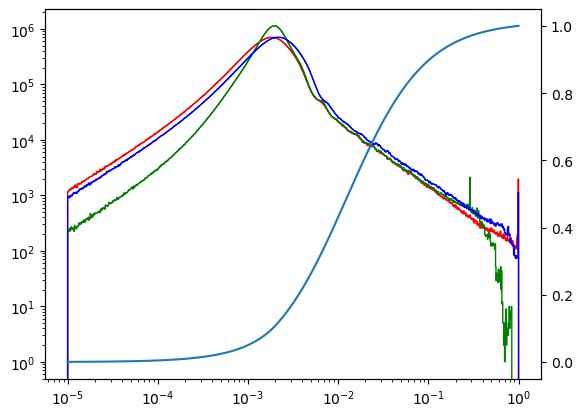

In [59]:
bins = np.logspace(-5,0,1000)
odp.show_hist(light_pp, bins=bins)
plt.xscale('log')
plt.twinx()

y = odp.ghs(bins, **ghs_args)
plt.plot(bins,y)

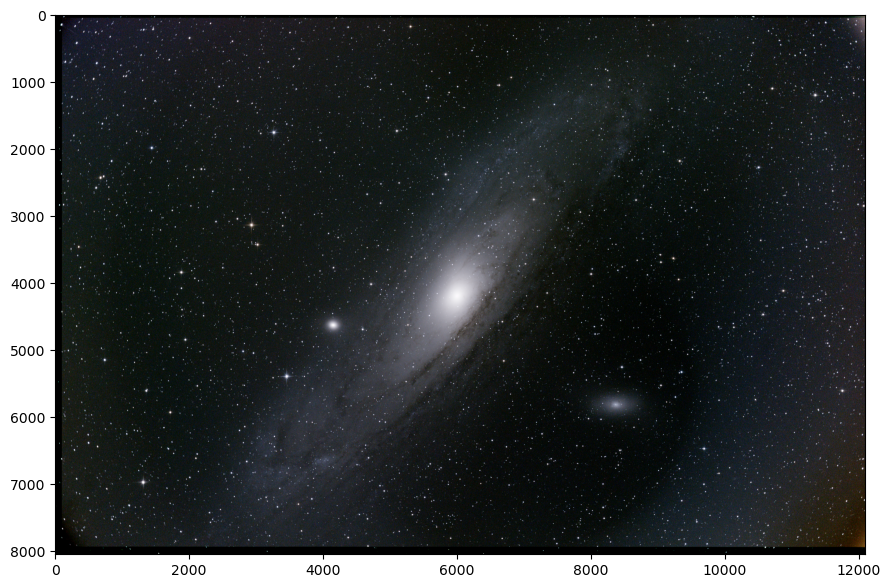

In [56]:
light_pp_ghs = odp.ghs(light_pp, **ghs_args)
odp.linear_rgb(light_pp_ghs, save=f'{tag}_pp_ghs.jpg', quality=95)

## HQ Output

For further manipulation

In [57]:
import cv2

In [58]:
data = np.flip(light_pp_ghs*(2**16),axis=2).astype(dtype=np.uint16)
cv2.imwrite(f'{tag}.png',data)

True